In [1]:
import numpy as np
import networkx as nx
import pandas as pd

from matplotlib import pyplot as plt
import seaborn as sns
import math
from tqdm.notebook import tqdm
from sklearn.cluster import KMeans
from numba import jit
from pyvis.network import Network
from sklearn.neighbors import KNeighborsRegressor
from spreads import *
from graph_learning_algorithm import *
from backtesting import compute_factor_residuals
import scipy

In [75]:
L_identity_fun = compute_identity_L()
L_corr_fun = compute_corr_L(k=10, use_abs=False)
L_LGMRF_fun = compute_LGMRF_L(use_correlations=True, use_abs=False, reltol=5e-5,
                          laplacian_root=True, adjust_laplacian=False)
L_SGS_fun = compute_SGS_L(alpha=1, beta=.1, laplacian_root=True,
                      adjust_laplacian=False, threshold=1e-4, normalize=True)

In [3]:
prices = pd.read_csv("data/sp500_prices_long.csv", parse_dates=['Date'])
prices['month'] = prices['Date'].dt.month
prices['year'] = prices['Date'].dt.year
raw_monthly_prices = prices.groupby(['year', 'month']).last().reset_index()
raw_monthly_prices['year_month'] = raw_monthly_prices['year'].astype(str) + ('00' + raw_monthly_prices['month'].astype(str)).str[-2:]
raw_monthly_prices = raw_monthly_prices.set_index('year_month').drop(columns=['year', 'month', 'Date'])
monthly_prices = raw_monthly_prices.loc[:, raw_monthly_prices.isna().mean(axis=0) < .75]
monthly_log_returns = np.log2(monthly_prices).diff().iloc[1:]#.shift(-1).iloc[:-1]
monthly_log_returns

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
year_month,,,,,,,,,,,,,,,,,,,,,
199502,NaN,NaN,NaN,-0.027647,NaN,NaN,0.637430,0.005089,NaN,0.305002,...,NaN,-0.031535,0.048742,-0.074000,NaN,NaN,NaN,-0.137053,0.083523,NaN
199503,NaN,NaN,NaN,-0.164231,NaN,NaN,-0.271302,0.010125,NaN,0.470922,...,NaN,-0.040414,0.060813,0.066775,NaN,NaN,NaN,0.172677,-0.072383,NaN
199504,NaN,NaN,NaN,0.117837,NaN,NaN,0.271302,0.147305,NaN,0.234830,...,NaN,0.029978,0.060949,0.020611,NaN,NaN,NaN,0.162084,0.175223,NaN
199505,NaN,NaN,NaN,0.123818,NaN,0.040190,-0.041820,0.022720,NaN,-0.163747,...,NaN,0.098448,0.053700,0.030374,NaN,NaN,NaN,-0.027783,0.086218,NaN
199506,NaN,NaN,NaN,0.160009,NaN,0.003958,0.021062,0.017922,NaN,0.157541,...,NaN,-0.038577,-0.015239,0.003030,NaN,NaN,NaN,0.242856,0.154145,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202206,-0.103006,-0.494985,-0.120798,-0.122538,0.055597,-0.129714,-0.091411,-0.112481,-0.104270,-0.186167,...,-0.214195,-0.080151,-0.164750,-0.141822,-0.107877,-0.097781,-0.191086,-0.202263,-0.164308,0.008080
202207,0.177692,0.112674,0.161706,0.249304,-0.080456,0.044678,0.243463,0.008919,0.146612,0.163966,...,0.155847,0.048515,0.178658,0.017259,0.235305,0.110433,0.071396,0.283139,0.099914,0.089451
202208,-0.064350,-0.077827,-0.199281,-0.045741,-0.093974,0.010699,-0.176439,-0.084475,-0.086386,-0.135170,...,-0.067222,0.020942,-0.006134,-0.142019,-0.009907,-0.132521,-0.054197,-0.245882,0.022701,-0.221852


In [4]:
factors = pd.read_csv("data/F-F_Research_Data_5_Factors_2x3_daily.csv", skiprows=2).rename(columns={'Unnamed: 0': 'Date'})
# factors = factors[factors['Date'].astype(str).str.strip().str.len() == 6]
factors = factors.set_index('Date')
factors.columns += '_factor'
factors = factors.astype(np.float64)
factors_date_str = factors.index.astype('str')
factors.index = pd.to_datetime(factors_date_str.str[:4] + '-' + factors_date_str.str[4:6] + '-' + factors_date_str.str[6:])
factors

,Mkt-RF_factor,SMB_factor,HML_factor,RMW_factor,CMA_factor,RF_factor
Date,,,,,,
1963-07-01,-0.67,0.02,-0.35,0.03,0.13,0.012
1963-07-02,0.79,-0.28,0.28,-0.08,-0.21,0.012
1963-07-03,0.63,-0.18,-0.10,0.13,-0.25,0.012
1963-07-05,0.40,0.09,-0.28,0.07,-0.30,0.012
1963-07-08,-0.63,0.07,-0.20,-0.27,0.06,0.012
...,...,...,...,...,...,...
2022-09-26,-1.02,-0.05,-0.75,0.18,-0.41,0.009
2022-09-27,-0.05,0.57,-0.93,-0.61,-0.89,0.009
2022-09-28,2.15,0.91,-0.33,-0.85,-0.71,0.009


In [64]:
N = 50
sp500_df = pd.read_csv('data/sp500.csv', parse_dates=['Date_First_Added'])
sp500_df = sp500_df[sp500_df['Date_First_Added'] < "2021"]
display(sp500_df)
sp_ticker_groups = sp500_df[['Symbol', 'GICS', 'GICS_Sub_Industry']]
large_cap_tickers = sp500_df.sort_values('Weight', ascending=False)[:N]['Symbol'].values
large_cap_tickers = large_cap_tickers[large_cap_tickers != 'ANTM']
print(np.sort(large_cap_tickers))

,Company,Symbol,Weight,Security,SEC_filings,GICS,GICS_Sub_Industry,Headquarters_Location,Date_First_Added,CIK,Founded
0,Agilent Technologies Inc.,A,0.117804,Agilent Technologies,reports,Health Care,Health Care Equipment,"Santa Clara, California",2000-06-05,1090872,1999
1,American Airlines Group Inc.,AAL,0.028874,American Airlines Group,reports,Industrials,Airlines,"Fort Worth, Texas",2015-03-23,6201,1934
2,Advance Auto Parts Inc.,AAP,0.038548,Advance Auto Parts,reports,Consumer Discretionary,Automotive Retail,"Raleigh, North Carolina",2015-07-09,1158449,1932
3,Apple Inc.,AAPL,6.840133,Apple,reports,Information Technology,"Technology Hardware, Storage & Peripherals","Cupertino, California",1982-11-30,320193,1977
4,AbbVie Inc.,ABBV,0.598127,AbbVie,reports,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888)
...,...,...,...,...,...,...,...,...,...,...,...
497,Yum! Brands Inc.,YUM,0.100377,Yum! Brands,reports,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061,1997
498,Zimmer Biomet Holdings Inc.,ZBH,0.064069,Zimmer Biomet,reports,Health Care,Health Care Equipment,"Warsaw, Indiana",2001-08-07,1136869,1927
499,Zebra Technologies Corporation Class A,ZBRA,0.078643,Zebra Technologies,reports,Information Technology,Electronic Equipment & Instruments,"Lincolnshire, Illinois",2019-12-23,877212,1969
500,Zions Bancorporation N.A.,ZION,0.024844,Zions Bancorp,reports,Financials,Regional Banks,"Salt Lake City, Utah",2001-06-22,109380,1873


['AAPL' 'ABBV' 'ABT' 'ACN' 'ADBE' 'AMZN' 'AVGO' 'BAC' 'BRK-B' 'CMCSA'
 'COST' 'CRM' 'CSCO' 'CVX' 'DIS' 'GOOG' 'GOOGL' 'HD' 'INTC' 'INTU' 'JNJ'
 'JPM' 'KO' 'LIN' 'LLY' 'LOW' 'MA' 'MCD' 'META' 'MRK' 'MSFT' 'NEE' 'NFLX'
 'NKE' 'NVDA' 'ORCL' 'PEP' 'PFE' 'PG' 'PYPL' 'T' 'TMO' 'TSLA' 'UNH' 'UNP'
 'V' 'VZ' 'WFC' 'WMT' 'XOM']


In [65]:
X_train_returns = monthly_log_returns[large_cap_tickers].dropna().iloc[:-1]
X_train_returns = np.log(prices.set_index('Date')[monthly_log_returns.columns]).diff().dropna()[large_cap_tickers]
X_train = compute_factor_residuals(X_train_returns, factors.loc[X_train_returns.index])
X_train = X_train / (X_train ** 2).sum()

# X_train = np.log(prices.set_index('Date')[monthly_log_returns.columns]).diff().dropna()[large_cap_tickers]

In [66]:
X_train

,AAPL,MSFT,AMZN,GOOGL,GOOG,META,TSLA,NVDA,BRK-B,UNH,...,MCD,MRK,WFC,NEE,T,INTU,LOW,LIN,UNP,ORCL
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-20,0.094194,0.059065,-0.039400,-0.127107,-0.100893,-0.015661,-0.035460,0.012340,0.017542,-0.004657,...,-0.026310,-0.075160,0.002786,0.008392,0.004713,0.038685,-0.017938,0.016000,0.037025,0.003264
2015-10-21,0.029217,-0.039802,-0.009173,-0.027116,-0.025406,0.016485,-0.001899,-0.003636,-0.010702,-0.045521,...,-0.040218,0.029153,0.044098,0.021851,0.000451,0.013886,0.015041,-0.038146,0.013441,-0.002065
2015-10-22,-0.001398,0.009859,0.007327,-0.001465,0.000695,0.022048,-0.006243,0.018037,0.223328,-0.165212,...,0.340454,0.081115,-0.006956,0.021455,0.007040,0.066168,-0.013560,0.048015,0.100577,0.067897
2015-10-23,0.072865,0.589064,0.137393,0.218768,0.315016,0.019676,-0.017855,-0.018386,-0.036332,0.032785,...,0.043663,0.045097,0.023890,-0.057403,-0.046759,-0.016293,-0.023945,0.023142,-0.035387,-0.004795
2015-10-26,-0.133796,0.180897,0.040355,0.085387,0.079088,0.027818,0.017517,-0.008482,-0.024104,0.023053,...,-0.012066,0.005904,0.000898,-0.019762,0.002886,-0.012734,0.027691,-0.064670,-0.060096,0.033083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.047124,0.048703,0.050850,0.013412,0.024153,-0.041825,0.007762,-0.016068,-0.037470,-0.007356,...,-0.013957,-0.008492,0.032583,-0.038550,-0.059549,0.058376,-0.003710,-0.050164,-0.019521,-0.031482
2022-09-27,0.020974,-0.041373,-0.035245,-0.043312,-0.044539,-0.036218,0.011045,0.011511,0.094941,0.001404,...,-0.143291,-0.014602,0.038621,-0.001866,0.028224,0.040590,0.025285,0.020936,-0.062685,-0.055860
2022-09-28,-0.150332,-0.024814,0.023935,0.019870,0.024460,0.051950,-0.010276,-0.013277,0.104587,-0.020781,...,-0.058449,0.003242,-0.005205,0.014806,-0.019111,-0.022411,0.040733,0.028956,0.023891,-0.024157


In [80]:
def plot_graph(L, log_returns, sp_ticker_groups, ax, width_coef=4, k=None):
    A = Adj(LapInv(L))
    G = nx.from_numpy_matrix(A)
    widths = nx.get_edge_attributes(G, 'weight')
    nodelist = G.nodes()

    pos = nx.spring_layout(G, k=k, iterations=50, seed=1234)
    # pos = nx.kamada_kawai_layout(G)
    for i, gics in enumerate(sp_ticker_groups['GICS'].unique()):
        tickers_gics = sp_ticker_groups[sp_ticker_groups['GICS'] == gics]['Symbol'].values.tolist()
        nodelist_gics = np.array(nodelist)[log_returns.columns.isin(tickers_gics)]
        nx.draw_networkx_nodes(G, pos,
                               nodelist=nodelist_gics,
                               node_size=1500/6,
                               node_color=[sns.color_palette("hls", 11)[i]], ax=ax)
    nx.draw_networkx_edges(G, pos,
                           edgelist=widths.keys(),
                           width=np.array(list(widths.values()))*width_coef, ax=ax)
    nx.draw_networkx_labels(G, pos, 
                           dict(enumerate(log_returns.columns)), font_size=9,ax=ax)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    return

In [76]:
L_identity, _ = L_identity_fun(X_train)
L_corr, _ = L_corr_fun(X_train)
L_SGS, _ = L_SGS_fun(X_train)
L_SGS_norm = nx.normalized_laplacian_matrix(nx.from_numpy_matrix(Adj(LapInv(L_SGS)))).todense()
L_LGMRF, _ = L_LGMRF_fun(X_train.values)

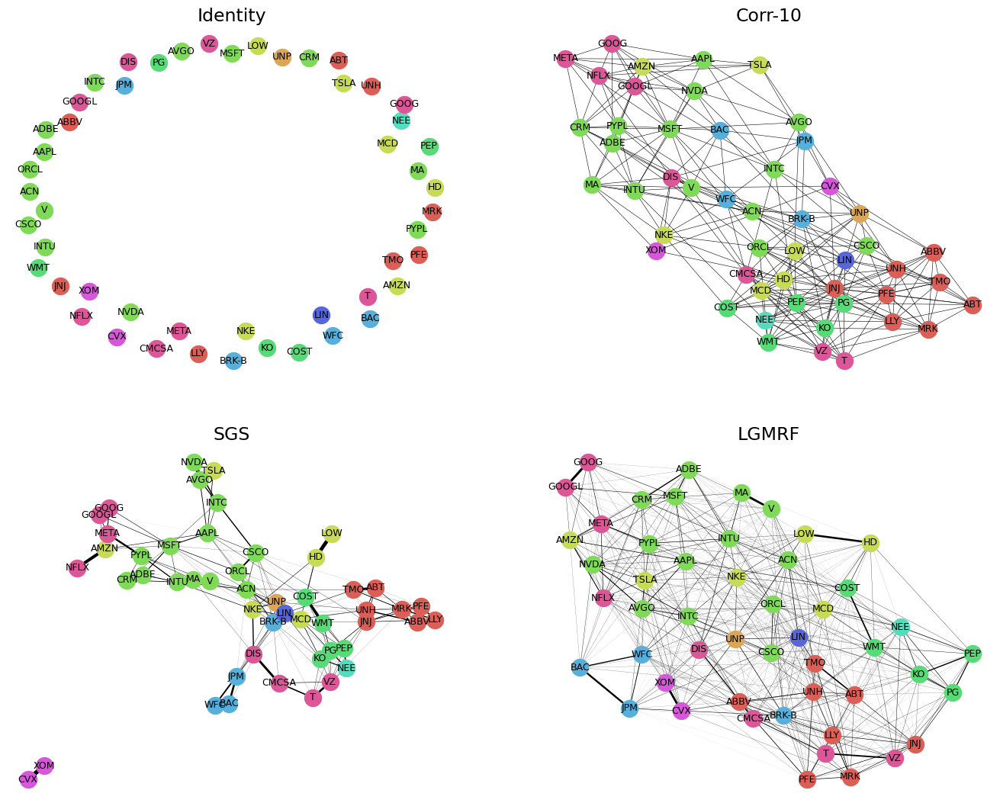

In [86]:
fig, axs = plt.subplots(2, 2, figsize=(2*25/3, 2*20/3), dpi=100)

plot_graph(L_identity, X_train, sp_ticker_groups, ax=axs[0, 0])
axs[0, 0].set_title('Identity', fontsize=17)
plot_graph(L_corr, X_train, sp_ticker_groups, ax=axs[0, 1])
axs[0, 1].set_title('Corr-10', fontsize=17)
plot_graph(L_SGS_norm, X_train, sp_ticker_groups, ax=axs[1, 0])
axs[1, 0].set_title('SGS', fontsize=17)
plot_graph(L_LGMRF, X_train, sp_ticker_groups, ax=axs[1, 1])
axs[1, 1].set_title('LGMRF', fontsize=17)

plt.savefig('img/vis_graph.pdf')

plt.show()

### Large Graph

In [20]:
# X_train_returns_large = monthly_log_returns.loc[:, monthly_log_returns.columns.isin(sp500_df['Symbol'])].iloc[:-1]#.dropna()

X_train_returns_large = np.log(prices.set_index('Date')[monthly_log_returns.columns]).diff().loc[:, monthly_log_returns.columns.isin(sp500_df['Symbol'])].diff().dropna()
X_train_returns_large = X_train_returns_large.loc[:, X_train_returns_large.isna().sum() < 200].dropna()
X_train_large = compute_factor_residuals(X_train_returns_large, factors.loc[X_train_returns_large.index])
X_train_large = X_train_large / (X_train_large**2).sum()
# X_train_large = np.log(prices.set_index('Date')[monthly_log_returns.columns]).loc[:, monthly_log_returns.columns.isin(sp500_df['Symbol'])].diff().dropna()
X_train_large

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-21,-0.008921,-0.000584,-0.008000,-0.011001,0.012083,0.018274,0.001016,0.042202,-0.007041,0.016121,...,-0.000432,-0.014108,0.002853,0.016423,-0.003802,-0.008902,0.003206,0.001954,-0.029422,-0.016523
2015-10-22,0.002213,0.011055,-0.003691,-0.004069,-0.111589,-0.007561,-0.028087,0.006165,0.048718,0.014477,...,-0.000121,0.011812,0.027149,-0.009720,0.016524,-0.047386,-0.032180,0.003806,0.021290,-0.001956
2015-10-23,0.014008,-0.018863,-0.004505,0.000142,0.156964,-0.006598,0.044405,-0.060541,-0.059096,-0.045165,...,0.023894,-0.067706,-0.043454,-0.019005,-0.027737,0.011074,0.019037,0.011514,0.002254,0.078084
2015-10-26,-0.046141,0.010808,0.003136,-0.075030,-0.011611,0.004072,-0.023335,-0.000945,-0.019954,0.014235,...,-0.026288,0.047949,-0.018177,0.001190,-0.026692,0.025341,0.001165,-0.023354,-0.015061,-0.068184
2015-10-27,0.022385,-0.000537,0.004325,0.035733,-0.014550,0.038703,0.004357,0.013910,0.006720,-0.017417,...,0.000778,-0.015337,0.032832,0.006182,0.014519,-0.044398,0.008285,-0.004873,0.003146,0.025448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-26,0.010047,0.008981,0.008827,0.035159,-0.006432,0.023076,0.000128,0.008400,0.018509,-0.007884,...,0.045545,-0.007801,0.053692,-0.013484,0.013331,-0.007736,0.016293,0.013839,0.019648,-0.006850
2022-09-27,0.004086,0.020871,0.019001,0.003566,0.018649,0.000715,0.006621,-0.009012,0.008760,0.021376,...,-0.039410,0.002058,0.053188,-0.000195,0.007610,0.001736,0.007570,0.003114,0.010460,0.022209
2022-09-28,-0.000008,-0.009680,-0.002372,-0.057732,0.000758,0.008835,-0.003076,-0.001190,0.002454,-0.017102,...,-0.009996,0.033008,-0.004054,0.008334,0.008225,0.000801,0.010024,-0.001248,0.000600,-0.011356


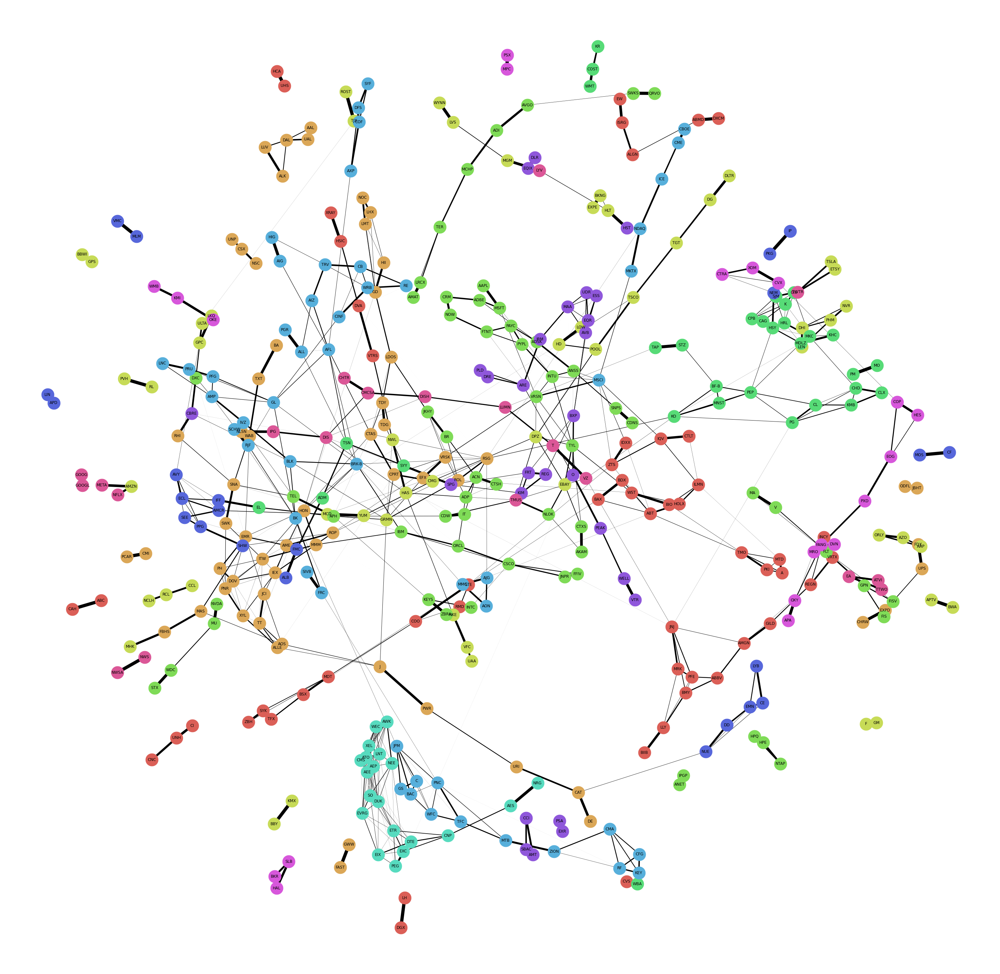

In [21]:
fig, ax = plt.subplots(figsize=(55, 55))

L_SGS_large, _ = L_SGS_fun(X_train_large)
L_SGS_norm_large = nx.normalized_laplacian_matrix(nx.from_numpy_matrix(Adj(LapInv(L_SGS_large)))).todense()
plot_graph(L_SGS_norm_large, X_train_large, sp_ticker_groups, ax=ax, k=1/15)

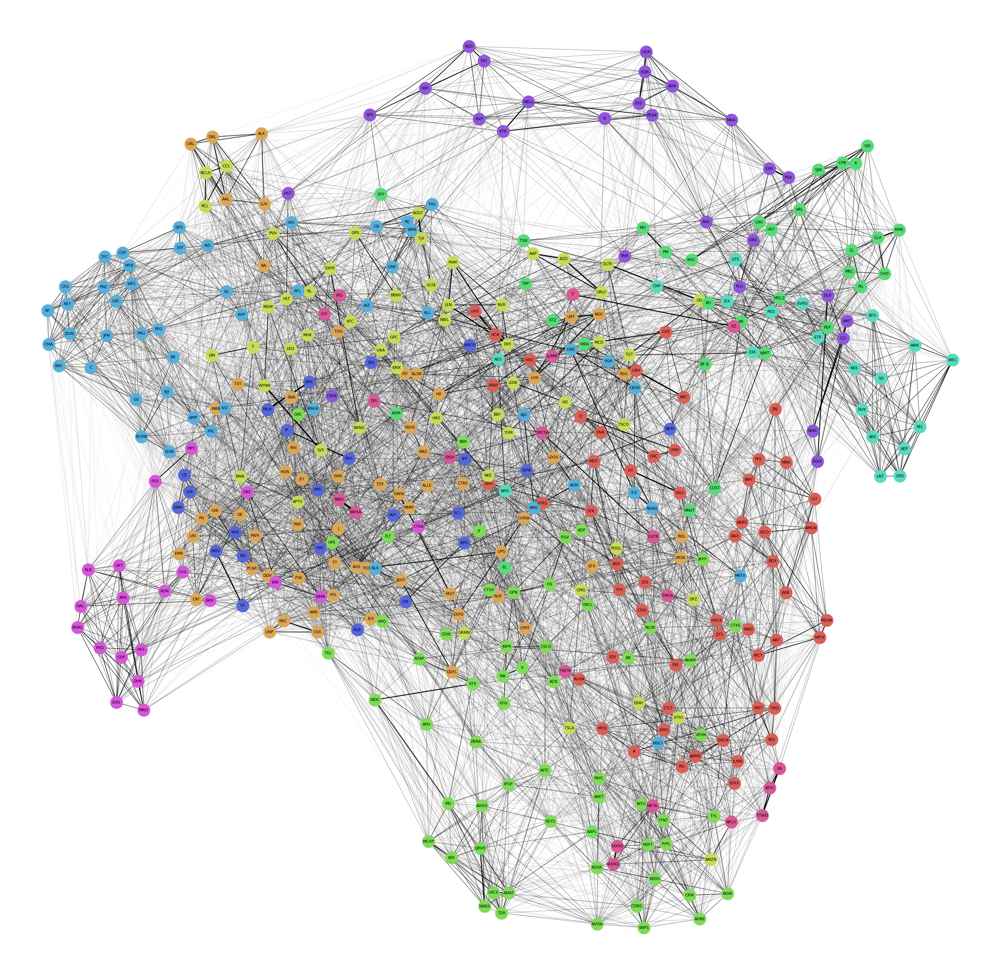

In [89]:
fig, ax = plt.subplots(figsize=(55, 55))

# L_LGMRF_large, _ = L_LGMRF_fun(X_train_large.values)
plot_graph(L_LGMRF_large * ((L_LGMRF_large < -1e-4) | (L_LGMRF_large > 0)), X_train_large, 
           sp_ticker_groups, ax=ax, width_coef=15)

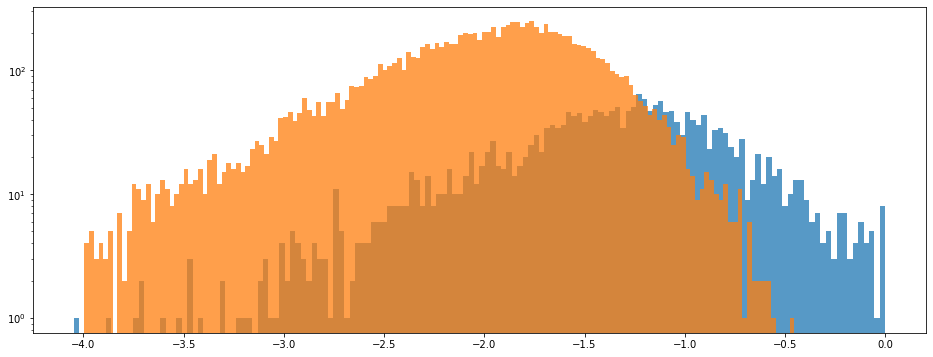

In [83]:
w_LGMRF_large = LapInv(L_LGMRF_large)
w_SGS_large = LapInv(L_SGS_norm_large)
w_SGS_large = np.squeeze(np.asarray(w_SGS_large[w_SGS_large != 0]))

fig, ax = plt.subplots(1, figsize=(16, 6))

ax.hist(np.log10(w_SGS_large[w_SGS_large != 0]), bins=150, alpha=.75)
ax.hist(np.log10(w_LGMRF_large[w_LGMRF_large > 1e-4]), bins=150, alpha=.75)
ax.set_yscale('log')

# ax.hist((w_SGS_large[w_SGS_large != 0]), bins=150, alpha=.75)
# ax.hist((w_LGMRF_large[w_LGMRF_large > 1e-4]), bins=150, alpha=.75)


# axs[0].set_xlim(-4, 0)
# axs[1].set_yscale('log')
#axs[1].set_xlim(-4, 0)
plt.show()

In [285]:
(L_LGMRF_large_returns == 0).mean(), (L_LGMRF_large == 0).mean()

(0.9111970879787551, 0.9383599276573339)